# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

In [ ]:
My client is a used car sales business that wants to understand what characteristics of used cars most significantly 
influence their sale price in order to maximize profits by making data-driven decisions related to inventory, purchasing,
and pricing. This type of business maximizes profitability by clearly understanding how different features (age, mileage,
condition, etc.) influence resale value in order to avoid overpaying for low-margin vehicles, prioritizing stocking high-margin
vehicles, and set profitable and competitive prices.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [ ]:
1) High level cleanup: remove unnecessary (id-only) fields or fields that are missing significant amounts of data
2) Check for and handle outliers
3) Query data to make sure it makes intuitive sense (there aren't "new" condition cars that have 200k miles, for example)
4) Convert data as necessary for clarity and analysis
5) Create plots to better understand the core relationships


### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [2]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel
import plotly.express as px
from sklearn.linear_model import Ridge
import seaborn as sns
import matplotlib.pyplot as plt


In [3]:
all_vehicles=pd.read_csv('data/vehicles.csv')

In [3]:
all_vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [39]:
vehicles = all_vehicles.drop(columns=['id', 'VIN']) # drop id and VIN because they are identifiers
vehicles=vehicles.drop(columns=['cylinders', 'drive', 'size', 'type', 'paint_color']) # keep only columns with > 400000 records
vehicles=vehicles.dropna()
vehicles.info()
vehicles=vehicles[vehicles['price'] > 500] # Everything less than $500 is assumed to be incorrect


<class 'pandas.core.frame.DataFrame'>
Index: 232322 entries, 27 to 426879
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        232322 non-null  object 
 1   price         232322 non-null  int64  
 2   year          232322 non-null  float64
 3   manufacturer  232322 non-null  object 
 4   model         232322 non-null  object 
 5   condition     232322 non-null  object 
 6   fuel          232322 non-null  object 
 7   odometer      232322 non-null  float64
 8   title_status  232322 non-null  object 
 9   transmission  232322 non-null  object 
 10  state         232322 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 21.3+ MB


In [40]:
fig = px.box(vehicles, y="price")
fig.show() # shows upper fence at 58k

In [41]:
vehicles=vehicles[vehicles['price'] < 58000] # based on upper fence of box plot

In [42]:
fig = px.box(vehicles, y="odometer")
fig.show() # shows upper and lower fences at 289000 and 0

In [43]:
vehicles=vehicles[vehicles['odometer'] < 289000]
vehicles=vehicles[vehicles['odometer'] > 1000]

In [44]:
# Region isn't relevant because our used car lot will be in a specific area. Furthermore, the regions in the data don't seem representative
vehicles=vehicles.drop(columns=['region', 'manufacturer', 'model'])

In [45]:
# filter out "other" because it's not helpful for business decisions
vehicles=vehicles[vehicles['fuel'] != 'other']

# only look at "clean" titles because the business can't sell cars without one
vehicles=vehicles[vehicles['title_status'] == 'clean']

# filter out "other" because it's not helpful for business decisions
vehicles=vehicles[vehicles['transmission'] != 'other']

# created "Good" and "Bad" categories out of "condition" because several of the options are redundant and not meaningfully different
vehicles['condition_mapped']=np.where(vehicles['condition'].isin(['excellent', 'good', 'new', 'like new']), 'Good', 'Bad')

vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 146994 entries, 31 to 426874
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   price             146994 non-null  int64  
 1   year              146994 non-null  float64
 2   condition         146994 non-null  object 
 3   fuel              146994 non-null  object 
 4   odometer          146994 non-null  float64
 5   title_status      146994 non-null  object 
 6   transmission      146994 non-null  object 
 7   state             146994 non-null  object 
 8   condition_mapped  146994 non-null  object 
dtypes: float64(2), int64(1), object(6)
memory usage: 11.2+ MB


In [46]:
# only "clean" titles left so we don't need the column
vehicles=vehicles.drop(columns=['title_status'])


In [47]:
# condition was mapped to a new column, state isn't relevant to an existing business
vehicles=vehicles.drop(columns=['condition', 'state'])

In [48]:
# omit classic cars because they are typically sold by specialized sellers and not used car lots
# so this information isn't relevant to my client
vehicles=vehicles[vehicles['year']>1990]

In [49]:
# Used car year to create a new column indicating 5 year age ranges
bins = [1990, 1995, 2000, 2005, 2010, 2015, 2020, 2025, 2030]
labels = ["1990-1994", "1995-1999", "2000-2004", "2005-2009", "2010-2014", "2015-2019", "2020-2024", "2025-2029"]
vehicles["year_int"] = vehicles["year"].astype(int)

vehicles['age_range'] = pd.cut(vehicles['year_int'], bins=bins, labels=labels, right=True, include_lowest=True)

In [50]:
# Broke odometer into 50k mile categories
odometer_bins=[0, 50000, 100000, 150000, 200000, 250000, 300000, 350000]
odometer_labels=["0-49999", "50000-99999", "100000-149999", "150000-199999", "200000-249999", "250000-299999", "300000-349999"]
vehicles['odometer_int']=vehicles['odometer'].astype(int)
vehicles['odometer_range']=pd.cut(vehicles['odometer_int'], bins=odometer_bins, labels=odometer_labels, right=True, include_lowest=True)
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 141521 entries, 31 to 426874
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   price             141521 non-null  int64   
 1   year              141521 non-null  float64 
 2   fuel              141521 non-null  object  
 3   odometer          141521 non-null  float64 
 4   transmission      141521 non-null  object  
 5   condition_mapped  141521 non-null  object  
 6   year_int          141521 non-null  int64   
 7   age_range         141521 non-null  category
 8   odometer_int      141521 non-null  int64   
 9   odometer_range    141521 non-null  category
dtypes: category(2), float64(2), int64(3), object(3)
memory usage: 10.0+ MB


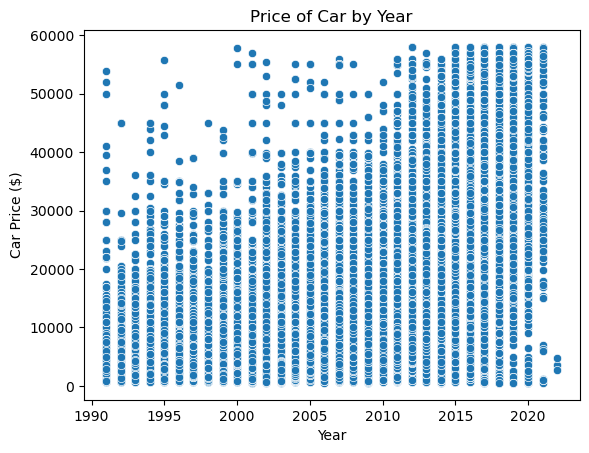

In [51]:
sns.scatterplot(x="year", y="price", data=vehicles)
plt.title("Price of Car by Year")
plt.xlabel("Year")
plt.ylabel("Car Price ($)")
plt.savefig("./Price_of_Car_by_Year.png")

plt.show()

In [52]:
vehicles=vehicles.drop(columns=['year_int', 'year']) # now reflected in age_range


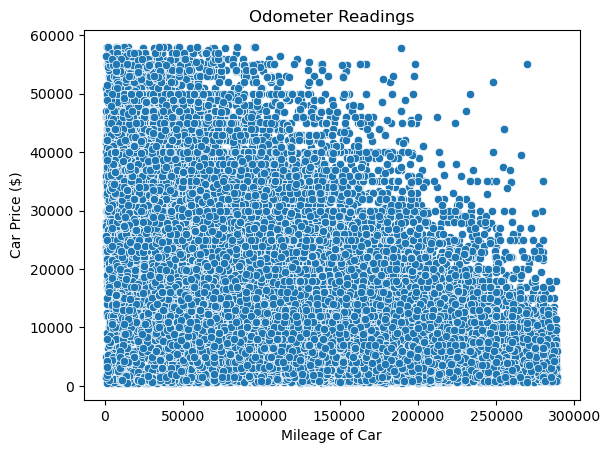

In [53]:
sns.scatterplot(x="odometer", y="price", data=vehicles)
plt.title("Odometer Readings")
plt.xlabel("Mileage of Car")
plt.ylabel("Car Price ($)")
plt.savefig("./Price_by_Odometer_Reading.png")

plt.show()

In [54]:
vehicles=vehicles.drop(columns=['odometer_int', 'odometer']) # now reflected in odometer_range

In [55]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 141521 entries, 31 to 426874
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   price             141521 non-null  int64   
 1   fuel              141521 non-null  object  
 2   transmission      141521 non-null  object  
 3   condition_mapped  141521 non-null  object  
 4   age_range         141521 non-null  category
 5   odometer_range    141521 non-null  category
dtypes: category(2), int64(1), object(3)
memory usage: 5.7+ MB


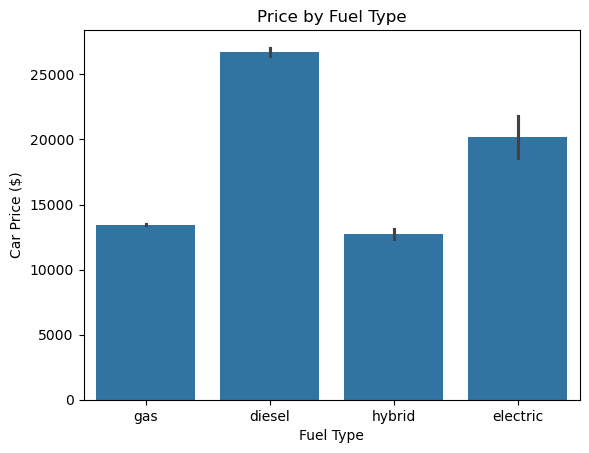

In [56]:
sns.barplot(data=vehicles, x="fuel", y="price")
plt.title("Price by Fuel Type")
plt.xlabel("Fuel Type")
plt.ylabel("Car Price ($)")
plt.savefig("./Price_by_Fuel_Type.png")
plt.show()

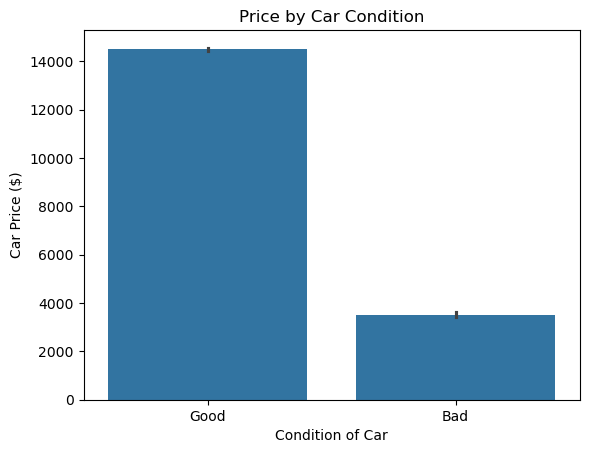

In [57]:
sns.barplot(data=vehicles, x="condition_mapped", y="price")
plt.title("Price by Car Condition")
plt.xlabel("Condition of Car")
plt.ylabel("Car Price ($)")
plt.savefig("./Price_by_Condition.png")
plt.show()

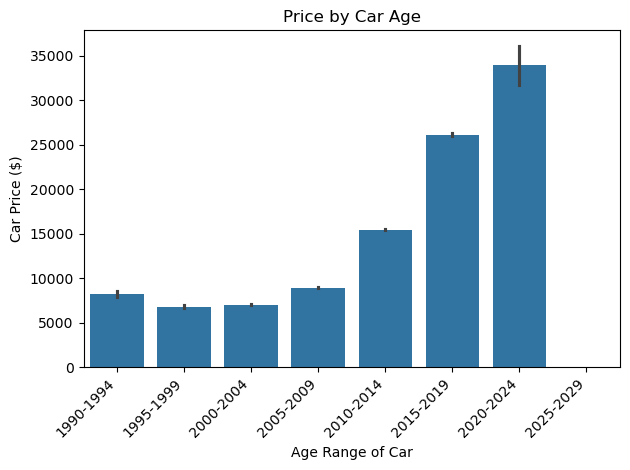

In [58]:
sns.barplot(data=vehicles, x="age_range", y="price")
plt.title("Price by Car Age")
plt.xlabel("Age Range of Car")
plt.ylabel("Car Price ($)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig("./Price_by_Age.png")
plt.show()

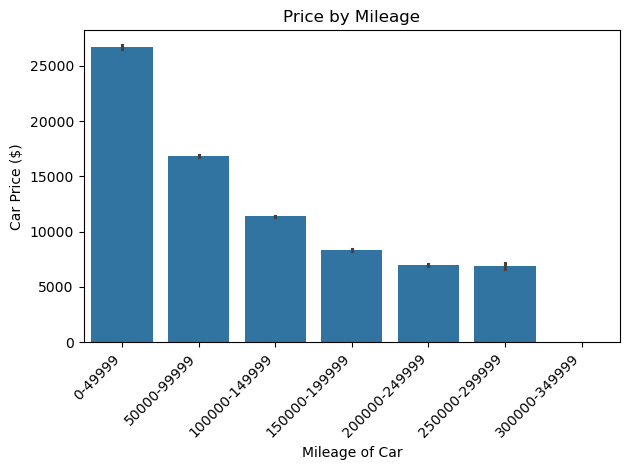

In [59]:
sns.barplot(data=vehicles, x="odometer_range", y="price")
plt.title("Price by Mileage")
plt.xlabel("Mileage of Car")
plt.ylabel("Car Price ($)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig("./Price_by_Mileage.png")
plt.show()

In [60]:
# Used one hot encoding to handle categorical variables
dummies_transmission = pd.get_dummies(vehicles['transmission'], dtype=int)
dummies_fuel=pd.get_dummies(vehicles['fuel'], dtype=int)
dummies_condition=pd.get_dummies(vehicles['condition_mapped'], dtype=int)
dummies_age=pd.get_dummies(vehicles['age_range'], dtype=int)
dummies_odometer=pd.get_dummies(vehicles['odometer_range'], dtype=int)

df=pd.concat([dummies_transmission, dummies_fuel, dummies_condition, dummies_age, dummies_odometer], axis=1)
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 141521 entries, 31 to 426874
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype
---  ------         --------------   -----
 0   automatic      141521 non-null  int64
 1   manual         141521 non-null  int64
 2   diesel         141521 non-null  int64
 3   electric       141521 non-null  int64
 4   gas            141521 non-null  int64
 5   hybrid         141521 non-null  int64
 6   Bad            141521 non-null  int64
 7   Good           141521 non-null  int64
 8   1990-1994      141521 non-null  int64
 9   1995-1999      141521 non-null  int64
 10  2000-2004      141521 non-null  int64
 11  2005-2009      141521 non-null  int64
 12  2010-2014      141521 non-null  int64
 13  2015-2019      141521 non-null  int64
 14  2020-2024      141521 non-null  int64
 15  2025-2029      141521 non-null  int64
 16  0-49999        141521 non-null  int64
 17  50000-99999    141521 non-null  int64
 18  100000-149999  141521 non-nu

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [61]:
y=vehicles['price']
# Separate data for training vs testing
X_train, X_test, y_train, y_test=train_test_split(df, y, test_size=0.3, random_state=42)

In [62]:
# Lasso with scaler to standardize the data
pipe = Pipeline([('polyfeatures', PolynomialFeatures(degree = 3, include_bias = False)),
                      ('scaler', StandardScaler()),
                     ('lasso', Lasso(random_state = 42))])
pipe.fit(X_train, y_train)
lasso_coefs=pipe.named_steps['lasso'].coef_

lasso_train_mse = mean_squared_error(y_train, pipe.predict(X_train))
lasso_test_mse = mean_squared_error(y_test, pipe.predict(X_test))
feature_names=pipe.named_steps['polyfeatures'].get_feature_names_out()
lasso_df=pd.DataFrame({ 'feature': feature_names, 'coef': lasso_coefs })

results=lasso_df.loc[lasso_df['coef'] != 0]

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+10, tolerance: 1.203e+09



In [63]:
print('lasso_train_mse', lasso_train_mse)
print('lasso_test_mse', lasso_test_mse)

lasso_train_mse 54903869.58784243
lasso_test_mse 53913575.88474476


In [64]:
sorted=results.sort_values(by='coef', ascending=False)
print(sorted.head(25)) # More expensive cars are newer (younger than 2010), lower mileage (less than 100k), and diesel

                              feature         coef
13                          2015-2019  3063.153761
16                            0-49999  2622.139804
2                              diesel  2253.449899
17                        50000-99999   907.946313
78                   diesel 2010-2014   496.494343
25                   automatic diesel   387.020408
650                manual gas 0-49999   261.976195
360    automatic diesel 100000-149999   219.535226
1008     diesel 2015-2019 50000-99999   214.884677
79                   diesel 2015-2019   210.960579
121                       gas 0-49999   204.021847
744      manual 2000-2004 50000-99999   198.849072
1009   diesel 2015-2019 100000-149999   192.411160
514   automatic 2010-2014 50000-99999   186.897382
1000   diesel 2010-2014 150000-199999   183.730803
14                          2020-2024   165.206032
755          manual 2005-2009 0-49999   164.766991
12                          2010-2014   158.434015
987      diesel 2005-2009 50000

In [65]:
print(sorted.tail(25)) # cheaper cars are primarily older (older than 2010), higher mileage (over 150k), or poor condition

                             feature         coef
778   manual 2015-2019 100000-149999   -93.517907
1401     gas 2010-2014 200000-249999   -94.136083
307            automatic^2 1990-1994   -95.315462
157                  Bad 50000-99999   -97.492024
130                      hybrid Good  -102.098586
1580  hybrid 2015-2019 100000-149999  -102.475760
977   diesel 2000-2004 150000-199999  -102.635934
411       automatic hybrid 2010-2014  -104.147954
308            automatic^2 1995-1999  -106.483504
32               automatic 1995-1999  -117.036191
177               Good 250000-299999  -119.990797
1409     gas 2015-2019 100000-149999  -153.505853
441         automatic Good 1995-1999  -160.093150
665          manual hybrid 2015-2019  -161.585007
175               Good 150000-199999  -175.062261
362   automatic diesel 200000-249999  -207.640288
998     diesel 2010-2014 50000-99999  -219.075286
57                  manual 2010-2014  -237.178566
19                     150000-199999  -250.100945


In [66]:
model_selector_pipe = Pipeline([('poly_features', PolynomialFeatures(degree = 3, include_bias = False)),
                                ('scaler', StandardScaler()),
                                ('selector', SelectFromModel(Lasso())),
                                    ('linreg', LinearRegression())])
model_selector_pipe.fit(X_train, y_train)
selector_train_mse=mean_squared_error(y_train, model_selector_pipe.predict(X_train))
selector_test_mse=mean_squared_error(y_test, model_selector_pipe.predict(X_test))
print('selector_train_mse', selector_train_mse)
print('selector_test_mse', selector_test_mse)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+10, tolerance: 1.203e+09



selector_train_mse 54903647.949284315
selector_test_mse 53919188.350353725


In [67]:
# Grid search to find the best alpha for Ridge Regression
# Ridge regression estimates coefficients of multiple-regression models when independent variables are highly correlated
# (potentially factors like car mileage and age, for example).
ridge_pipe = Pipeline([('scale', StandardScaler()), ('ridge', Ridge())])
param_dict = {'ridge__alpha': [0.001, 0.1, 1.0, 10.0, 100.0, 1000.0]}
grid = GridSearchCV(ridge_pipe, param_grid=param_dict)
grid.fit(X_train, y_train)
train_preds = grid.predict(X_train)
test_preds = grid.predict(X_test)
ridge_model_train_mse = mean_squared_error(y_train, train_preds)
ridge_model_test_mse = mean_squared_error(y_test, test_preds)
ridge_model_best_alpha = grid.best_params_
print('ridge_model_train_mse', ridge_model_train_mse)
print('ridge_model_test_mse', ridge_model_test_mse)
print('ridge_model_best_alpha', list(ridge_model_best_alpha.values())[0])

ridge_model_train_mse 56665166.0016743
ridge_model_test_mse 55411230.36045525
ridge_model_best_alpha 10.0


In [68]:
# Run Ridge regression with alpha 100 based on previous findings
# This could be used to evaluate prices for future cars based on similar criteria
# Ridge regression 
alpha_pipeline = Pipeline([('scale', StandardScaler()), ('ridge', Ridge(alpha=100))])
alpha_pipeline.fit(X_train, y_train)
train_preds = alpha_pipeline.predict(X_train)
test_preds=alpha_pipeline.predict(X_test)
train_mse=mean_squared_error(y_train, train_preds)
test_mse=mean_squared_error(y_test, test_preds)
print('train_mse', train_mse) # Same as above because it returned the values for alpha 100 which is what I'm running here
print('test_mse', test_mse) # Same as above because it returned the values for alpha 100 which is what I'm running here

train_mse 56665189.24349921
test_mse 55411420.07120325


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

In [ ]:
The plots, models, and common sense all suggest that mileage and car age will influence prices. The Lasso regression
did not converge and the mean squared errors are pretty high so it would be good to further refine or find additional data. At the 
moment I can provide some high-level advice to the clients but with the models performing at around +/- $7k error, there is
definitely room for improvement, especially considering that the average cost of the cars is not very high, so that error
could greatly impact profitability.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

In [ ]:
I focused on the effect of car age, condition, fuel type, mileage, and transmission on price, and limited 
my analysis to only cars with clean titles since they need to be resold to be profitable. Based on my findings,
the more expensive cars are newer (specifically younger than 2010), lower mileage (less than 100k miles), and have diesel
engines. Lower priced cars tend to be older (older than 2010 specifically), higher mileage (over 150k), and in poor condition.
I have a model that can help predict the price of the car based on this information but it should only be used as a high-level
guideline at this time. The error rate is high so I need to re-visit the data for further cleaning and see if there are
additional datasets I can include in the analysis to produce a model that will more reliably predict the price of a used car
based on its features.